<a href="https://colab.research.google.com/github/tealtourmaline/Mineria-y-calidad-de-datos/blob/main/CALIDAD_DE_DATOS.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **A. PERFILADO DE DATOS**

In [126]:
#Importamos librerías básicas
import pandas as pd # manipulacion dataframes
import numpy as np  # matrices y vectores
import matplotlib.pyplot as plt #gráfica

In [127]:
# Se cargan los datos
data= pd.read_csv("Resultados__nicos_Saber_11_20250514.csv")
data.head()

,PERIODO,ESTU_TIPODOCUMENTO,ESTU_CONSECUTIVO,COLE_AREA_UBICACION,COLE_BILINGUE,COLE_CALENDARIO,COLE_CARACTER,COLE_COD_DANE_ESTABLECIMIENTO,COLE_COD_DANE_SEDE,COLE_COD_DEPTO_UBICACION,...,FAMI_TIENECOMPUTADOR,FAMI_TIENEINTERNET,FAMI_TIENELAVADORA,DESEMP_INGLES,PUNT_INGLES,PUNT_MATEMATICAS,PUNT_SOCIALES_CIUDADANAS,PUNT_C_NATURALES,PUNT_LECTURA_CRITICA,PUNT_GLOBAL
0,20161,TI,SB11201610005757,URBANO,N,B,TÉCNICO/ACADÉMICO,311848000286,311848000286,11,...,Si,Si,Si,B+,92,100,96,83,69,437
1,20161,TI,SB11201610040978,URBANO,N,B,TÉCNICO,376001028219,376001028219,76,...,Si,Si,Si,A2,64,71,68,78,69,355
2,20161,CC,SB11201610011117,URBANO,S,B,ACADÉMICO,376001001221,376001001221,76,...,Si,Si,Si,B+,95,73,78,72,60,363
3,20161,CC,SB11201610025748,RURAL,S,B,ACADÉMICO,376001002279,376001002279,76,...,Si,Si,Si,B1,82,78,68,70,60,350
4,20161,TI,SB11201610024991,RURAL,S,B,ACADÉMICO,366001003814,366001003814,66,...,Si,Si,Si,B+,90,84,74,69,71,378


In [128]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12971 entries, 0 to 12970
Data columns (total 51 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   PERIODO                        12971 non-null  int64 
 1   ESTU_TIPODOCUMENTO             12971 non-null  object
 2   ESTU_CONSECUTIVO               12971 non-null  object
 3   COLE_AREA_UBICACION            12971 non-null  object
 4   COLE_BILINGUE                  11791 non-null  object
 5   COLE_CALENDARIO                12971 non-null  object
 6   COLE_CARACTER                  12944 non-null  object
 7   COLE_COD_DANE_ESTABLECIMIENTO  12971 non-null  int64 
 8   COLE_COD_DANE_SEDE             12971 non-null  int64 
 9   COLE_COD_DEPTO_UBICACION       12971 non-null  int64 
 10  COLE_COD_MCPIO_UBICACION       12971 non-null  int64 
 11  COLE_CODIGO_ICFES              12971 non-null  int64 
 12  COLE_DEPTO_UBICACION           12971 non-null  object
 13  C

In [129]:
#Limpieza inicial de columnas innecesarias
data = data.drop('COLE_COD_DANE_ESTABLECIMIENTO',axis=1) #Eliminamos el ID por ser irrelevante, axis=1 indica que es una columna
data = data.drop('COLE_COD_DANE_SEDE',axis=1)
data = data.drop('COLE_COD_DEPTO_UBICACION',axis=1)
data = data.drop('COLE_COD_MCPIO_UBICACION',axis=1)
data = data.drop('COLE_CODIGO_ICFES',axis=1)
data = data.drop('ESTU_COD_DEPTO_PRESENTACION',axis=1)
data = data.drop('ESTU_COD_MCPIO_PRESENTACION',axis=1)
data = data.drop('ESTU_COD_RESIDE_DEPTO',axis=1)
data = data.drop('ESTU_COD_RESIDE_MCPIO',axis=1)
data = data.drop('ESTU_TIPODOCUMENTO',axis=1)
data = data.drop('ESTU_CONSECUTIVO',axis=1)
data = data.drop('PERIODO',axis=1)
data = data.drop('COLE_NOMBRE_ESTABLECIMIENTO',axis=1)
data = data.drop('COLE_NOMBRE_SEDE',axis=1)
data = data.drop('ESTU_DEPTO_PRESENTACION',axis=1)
data = data.drop('ESTU_DEPTO_RESIDE',axis=1)
data = data.drop('ESTU_FECHANACIMIENTO',axis=1)

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12971 entries, 0 to 12970
Data columns (total 34 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   COLE_AREA_UBICACION       12971 non-null  object
 1   COLE_BILINGUE             11791 non-null  object
 2   COLE_CALENDARIO           12971 non-null  object
 3   COLE_CARACTER             12944 non-null  object
 4   COLE_DEPTO_UBICACION      12971 non-null  object
 5   COLE_GENERO               12971 non-null  object
 6   COLE_JORNADA              12971 non-null  object
 7   COLE_MCPIO_UBICACION      12971 non-null  object
 8   COLE_NATURALEZA           12971 non-null  object
 9   COLE_SEDE_PRINCIPAL       12971 non-null  object
 10  ESTU_ESTADOINVESTIGACION  12971 non-null  object
 11  ESTU_ESTUDIANTE           12971 non-null  object
 12  ESTU_GENERO               12971 non-null  object
 13  ESTU_MCPIO_PRESENTACION   12971 non-null  object
 14  ESTU_MCPIO_RESIDE     

In [130]:
#Corrección del tipo de datos object a categorías
data['COLE_AREA_UBICACION']=data['COLE_AREA_UBICACION'].astype('category')
data['COLE_BILINGUE']=data['COLE_BILINGUE'].astype('category')
data['COLE_CALENDARIO']=data['COLE_CALENDARIO'].astype('category')
data['COLE_CARACTER']=data['COLE_CARACTER'].astype('category')
data['COLE_DEPTO_UBICACION']=data['COLE_DEPTO_UBICACION'].astype('category')
data['COLE_GENERO']=data['COLE_GENERO'].astype('category')
data['COLE_JORNADA']=data['COLE_JORNADA'].astype('category')
data['COLE_MCPIO_UBICACION']=data['COLE_MCPIO_UBICACION'].astype('category')
data['COLE_NATURALEZA']=data['COLE_NATURALEZA'].astype('category')
data['COLE_SEDE_PRINCIPAL']=data['COLE_SEDE_PRINCIPAL'].astype('category')
data['ESTU_ESTADOINVESTIGACION']=data['ESTU_ESTADOINVESTIGACION'].astype('category')
data['ESTU_ESTUDIANTE']=data['ESTU_ESTUDIANTE'].astype('category')
data['ESTU_GENERO']=data['ESTU_GENERO'].astype('category')
data['ESTU_MCPIO_PRESENTACION']=data['ESTU_MCPIO_PRESENTACION'].astype('category')
data['ESTU_MCPIO_RESIDE']=data['ESTU_MCPIO_RESIDE'].astype('category')
data['ESTU_MCPIO_RESIDE']=data['ESTU_MCPIO_RESIDE'].astype('category')
data['ESTU_NACIONALIDAD']=data['ESTU_NACIONALIDAD'].astype('category')
data['ESTU_PAIS_RESIDE']=data['ESTU_PAIS_RESIDE'].astype('category')
data['ESTU_PRIVADO_LIBERTAD']=data['ESTU_PRIVADO_LIBERTAD'].astype('category')
data['FAMI_CUARTOSHOGAR']=data['FAMI_CUARTOSHOGAR'].astype('category')
data['FAMI_EDUCACIONMADRE']=data['FAMI_EDUCACIONMADRE'].astype('category')
data['FAMI_EDUCACIONPADRE']=data['FAMI_EDUCACIONPADRE'].astype('category')
data['FAMI_ESTRATOVIVIENDA']=data['FAMI_ESTRATOVIVIENDA'].astype('category')
data['FAMI_PERSONASHOGAR']=data['FAMI_PERSONASHOGAR'].astype('category')
data['FAMI_TIENEAUTOMOVIL']=data['FAMI_TIENEAUTOMOVIL'].astype('category')
data['FAMI_TIENECOMPUTADOR']=data['FAMI_TIENECOMPUTADOR'].astype('category')
data['FAMI_TIENEINTERNET']=data['FAMI_TIENEINTERNET'].astype('category')
data['FAMI_TIENELAVADORA']=data['FAMI_TIENELAVADORA'].astype('category')
data['DESEMP_INGLES']=data['DESEMP_INGLES'].astype('category')

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12971 entries, 0 to 12970
Data columns (total 34 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   COLE_AREA_UBICACION       12971 non-null  category
 1   COLE_BILINGUE             11791 non-null  category
 2   COLE_CALENDARIO           12971 non-null  category
 3   COLE_CARACTER             12944 non-null  category
 4   COLE_DEPTO_UBICACION      12971 non-null  category
 5   COLE_GENERO               12971 non-null  category
 6   COLE_JORNADA              12971 non-null  category
 7   COLE_MCPIO_UBICACION      12971 non-null  category
 8   COLE_NATURALEZA           12971 non-null  category
 9   COLE_SEDE_PRINCIPAL       12971 non-null  category
 10  ESTU_ESTADOINVESTIGACION  12971 non-null  category
 11  ESTU_ESTUDIANTE           12971 non-null  category
 12  ESTU_GENERO               12971 non-null  category
 13  ESTU_MCPIO_PRESENTACION   12971 non-null  cate

In [131]:
#Instalar pandas profiling
!pip install ydata-profiling

In [132]:
# Cargar librería para Profiling
from ydata_profiling import ProfileReport

profile_data=ProfileReport(data, minimal=False) # minimal=True
profile_data

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 34/34 [00:00<00:00, 80.82it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [133]:
#Guardamos en html el perfilado de datos
profile_data.to_file(output_file="PerfiladoDatosInicial.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

# **Dimensiones de la Calidad de Datos**

**Completitud:** ¿Está toda la información disponible? ¿Hay datos faltantes o ausentes?

**Exactitud:**¿La información es correcta y libre de error?

**Conformidad:** ¿Los valores de los datos están conformes con los formatos esperados? Ejemplo: Una fecha en formato AAAA/MM/DD cuando debería ser DD/MM/AAAA.

**Oportunidad:** ¿La información llega cuando se necesita?

**Duplicidad:** ¿Existen múltiples instancias, innecesarias de los mismos objetos de datos en el conjunto de datos?

**Integridad:** ¿Faltan datos relacionados importantes? ¿Es clara la conectividad y las relaciones con otros datos?

# **Diagnóstico de las dimensiones según el perfilado:**
* Completitud:  existen missing en COLE_BILINGUE, COLE_CARACTER, FAMI_CUARTOSHOGAR, FAMI_EDUCACIONMADRE, FAMI_EDUCACIONPADRE, FAMI_PERSONASHOGAR, FAMI_TIENEAUTOMOVIL, FAMI_TIENECOMPUTADOR, FAMI_TIENEINTERNET, FAMI_TIENELAVADORA
* Conformidad: Cumple
* Oportunidad: NA
* Duplicidad Hay 31 datos duplicados
* Integridad: Cumple

# **B. LIMPIEZA  DE LOS DATOS**
1. Detección de duplicados
2. Selección de datos
3. Limpieza de atípicos
4. Limpieza de nulos



**1. Detección de duplicados**

In [134]:
data = data.drop_duplicates()
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12940 entries, 0 to 12970
Data columns (total 34 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   COLE_AREA_UBICACION       12940 non-null  category
 1   COLE_BILINGUE             11760 non-null  category
 2   COLE_CALENDARIO           12940 non-null  category
 3   COLE_CARACTER             12913 non-null  category
 4   COLE_DEPTO_UBICACION      12940 non-null  category
 5   COLE_GENERO               12940 non-null  category
 6   COLE_JORNADA              12940 non-null  category
 7   COLE_MCPIO_UBICACION      12940 non-null  category
 8   COLE_NATURALEZA           12940 non-null  category
 9   COLE_SEDE_PRINCIPAL       12940 non-null  category
 10  ESTU_ESTADOINVESTIGACION  12940 non-null  category
 11  ESTU_ESTUDIANTE           12940 non-null  category
 12  ESTU_GENERO               12940 non-null  category
 13  ESTU_MCPIO_PRESENTACION   12940 non-null  category


**2. Selección de Datos**

In [135]:
# Variables irrelevantes para el proceso de minería
data = data.drop('PUNT_INGLES',axis=1) #axis=1 indica que es una columna
data = data.drop('COLE_CALENDARIO',axis=1)
data = data.drop('COLE_DEPTO_UBICACION',axis=1)
data = data.drop('COLE_MCPIO_UBICACION',axis=1)
data = data.drop('COLE_SEDE_PRINCIPAL',axis=1)
data = data.drop('ESTU_ESTADOINVESTIGACION',axis=1)
data = data.drop('ESTU_ESTUDIANTE',axis=1)
data = data.drop('ESTU_MCPIO_PRESENTACION',axis=1)
data = data.drop('ESTU_MCPIO_RESIDE',axis=1)
data = data.drop('ESTU_NACIONALIDAD',axis=1)
data = data.drop('ESTU_PAIS_RESIDE',axis=1)
data = data.drop('ESTU_PRIVADO_LIBERTAD',axis=1)
data = data.drop('COLE_NATURALEZA',axis=1)

data.head()

,COLE_AREA_UBICACION,COLE_BILINGUE,COLE_CARACTER,COLE_GENERO,COLE_JORNADA,ESTU_GENERO,FAMI_CUARTOSHOGAR,FAMI_EDUCACIONMADRE,FAMI_EDUCACIONPADRE,FAMI_ESTRATOVIVIENDA,...,FAMI_TIENEAUTOMOVIL,FAMI_TIENECOMPUTADOR,FAMI_TIENEINTERNET,FAMI_TIENELAVADORA,DESEMP_INGLES,PUNT_MATEMATICAS,PUNT_SOCIALES_CIUDADANAS,PUNT_C_NATURALES,PUNT_LECTURA_CRITICA,PUNT_GLOBAL
0,URBANO,N,TÉCNICO/ACADÉMICO,MASCULINO,COMPLETA,M,Tres,Postgrado,Educación profesional completa,Estrato 4,...,Si,Si,Si,Si,B+,100,96,83,69,437
1,URBANO,N,TÉCNICO,MIXTO,MAÑANA,M,Dos,Postgrado,Secundaria (Bachillerato) completa,Estrato 3,...,Si,Si,Si,Si,A2,71,68,78,69,355
2,URBANO,S,ACADÉMICO,MIXTO,COMPLETA,M,Cuatro,Educación profesional incompleta,Educación profesional completa,Estrato 6,...,Si,Si,Si,Si,B+,73,78,72,60,363
3,RURAL,S,ACADÉMICO,MIXTO,MAÑANA,M,Tres,Educación profesional completa,Educación profesional completa,Estrato 6,...,Si,Si,Si,Si,B1,78,68,70,60,350
4,RURAL,S,ACADÉMICO,MIXTO,COMPLETA,M,Dos,Postgrado,Educación profesional completa,Estrato 6,...,Si,Si,Si,Si,B+,84,74,69,71,378


**3. Limpieza de datos atípicos: se asigna nulo**

In [136]:
#No hay datos atípicos

**4. Limpieza de datos nulos: Imputación**

In [137]:
#Limpieza de datos nulos: Imputación por la media y moda
from sklearn.impute import SimpleImputer

#Imputacion de variables numéricas: media
#ImpNumeros = SimpleImputer(missing_values=np.nan, strategy='mean')
#data[['PUNT_MATEMATICAS', 'PUNT_SOCIALES_CIUDADANAS','PUNT_C_NATURALES','PUNT_LECTURA_CRITICA','PUNT_GLOBAL']] = ImpNumeros.fit_transform(data[['PUNT_MATEMATICAS', 'PUNT_SOCIALES_CIUDADANAS','PUNT_C_NATURALES','PUNT_LECTURA_CRITICA','PUNT_GLOBAL']])

#Imputacion de variables categóricas: moda
ImpCategorias = SimpleImputer(missing_values=np.nan, strategy='most_frequent')
data[['COLE_BILINGUE','COLE_CARACTER','FAMI_CUARTOSHOGAR','FAMI_EDUCACIONMADRE','FAMI_EDUCACIONPADRE','FAMI_ESTRATOVIVIENDA','FAMI_PERSONASHOGAR','FAMI_TIENEAUTOMOVIL','FAMI_TIENECOMPUTADOR','FAMI_TIENEINTERNET','FAMI_TIENELAVADORA']] = ImpCategorias.fit_transform(data[['COLE_BILINGUE','COLE_CARACTER','FAMI_CUARTOSHOGAR','FAMI_EDUCACIONMADRE','FAMI_EDUCACIONPADRE','FAMI_ESTRATOVIVIENDA','FAMI_PERSONASHOGAR','FAMI_TIENEAUTOMOVIL','FAMI_TIENECOMPUTADOR','FAMI_TIENEINTERNET','FAMI_TIENELAVADORA']])

data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12940 entries, 0 to 12970
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   COLE_AREA_UBICACION       12940 non-null  category
 1   COLE_BILINGUE             12940 non-null  object  
 2   COLE_CARACTER             12940 non-null  object  
 3   COLE_GENERO               12940 non-null  category
 4   COLE_JORNADA              12940 non-null  category
 5   ESTU_GENERO               12940 non-null  category
 6   FAMI_CUARTOSHOGAR         12940 non-null  object  
 7   FAMI_EDUCACIONMADRE       12940 non-null  object  
 8   FAMI_EDUCACIONPADRE       12940 non-null  object  
 9   FAMI_ESTRATOVIVIENDA      12940 non-null  object  
 10  FAMI_PERSONASHOGAR        12940 non-null  object  
 11  FAMI_TIENEAUTOMOVIL       12940 non-null  object  
 12  FAMI_TIENECOMPUTADOR      12940 non-null  object  
 13  FAMI_TIENEINTERNET        12940 non-null  object  


In [138]:
#Corrección del tipo de datos object a categorías
data['COLE_BILINGUE']=data['COLE_BILINGUE'].astype('category')
data['COLE_CARACTER']=data['COLE_CARACTER'].astype('category')
data['FAMI_CUARTOSHOGAR']=data['FAMI_CUARTOSHOGAR'].astype('category')
data['FAMI_EDUCACIONMADRE']=data['FAMI_EDUCACIONMADRE'].astype('category')
data['FAMI_EDUCACIONPADRE']=data['FAMI_EDUCACIONPADRE'].astype('category')
data['FAMI_ESTRATOVIVIENDA']=data['FAMI_ESTRATOVIVIENDA'].astype('category')
data['FAMI_PERSONASHOGAR']=data['FAMI_PERSONASHOGAR'].astype('category')
data['FAMI_TIENEAUTOMOVIL']=data['FAMI_TIENEAUTOMOVIL'].astype('category')
data['FAMI_TIENECOMPUTADOR']=data['FAMI_TIENECOMPUTADOR'].astype('category')
data['FAMI_TIENEINTERNET']=data['FAMI_TIENEINTERNET'].astype('category')
data['FAMI_TIENELAVADORA']=data['FAMI_TIENELAVADORA'].astype('category')

In [139]:
#Valores de la imputación
#print(ImpNumeros.statistics_)
print(ImpCategorias.statistics_)

['N' 'ACADÉMICO' 'Tres' 'Educación profesional completa'
 'Educación profesional completa' 'Estrato 3' 'Cuatro' 'Si' 'Si' 'Si' 'Si']


# **C. MEJORA DE LOS DATOS**


**1. Análisis de correlaciones**

In [140]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12940 entries, 0 to 12970
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   COLE_AREA_UBICACION       12940 non-null  category
 1   COLE_BILINGUE             12940 non-null  category
 2   COLE_CARACTER             12940 non-null  category
 3   COLE_GENERO               12940 non-null  category
 4   COLE_JORNADA              12940 non-null  category
 5   ESTU_GENERO               12940 non-null  category
 6   FAMI_CUARTOSHOGAR         12940 non-null  category
 7   FAMI_EDUCACIONMADRE       12940 non-null  category
 8   FAMI_EDUCACIONPADRE       12940 non-null  category
 9   FAMI_ESTRATOVIVIENDA      12940 non-null  category
 10  FAMI_PERSONASHOGAR        12940 non-null  category
 11  FAMI_TIENEAUTOMOVIL       12940 non-null  category
 12  FAMI_TIENECOMPUTADOR      12940 non-null  category
 13  FAMI_TIENEINTERNET        12940 non-null  category


In [141]:
data_num = pd.get_dummies(data, drop_first=True, dtype=int)
data_num.head()

,PUNT_MATEMATICAS,PUNT_SOCIALES_CIUDADANAS,PUNT_C_NATURALES,PUNT_LECTURA_CRITICA,PUNT_GLOBAL,COLE_AREA_UBICACION_URBANO,COLE_BILINGUE_S,COLE_CARACTER_NO APLICA,COLE_CARACTER_TÉCNICO,COLE_CARACTER_TÉCNICO/ACADÉMICO,...,FAMI_PERSONASHOGAR_Tres,FAMI_PERSONASHOGAR_Una,FAMI_TIENEAUTOMOVIL_Si,FAMI_TIENECOMPUTADOR_Si,FAMI_TIENEINTERNET_Si,FAMI_TIENELAVADORA_Si,DESEMP_INGLES_A1,DESEMP_INGLES_A2,DESEMP_INGLES_B+,DESEMP_INGLES_B1
0,100,96,83,69,437,1,0,0,0,1,...,1,0,1,1,1,1,0,0,1,0
1,71,68,78,69,355,1,0,0,1,0,...,1,0,1,1,1,1,0,1,0,0
2,73,78,72,60,363,1,1,0,0,0,...,0,0,1,1,1,1,0,0,1,0
3,78,68,70,60,350,0,1,0,0,0,...,1,0,1,1,1,1,0,0,0,1
4,84,74,69,71,378,0,1,0,0,0,...,0,0,1,1,1,1,0,0,1,0


In [142]:
#Correlaciones
data_num.corr()

,PUNT_MATEMATICAS,PUNT_SOCIALES_CIUDADANAS,PUNT_C_NATURALES,PUNT_LECTURA_CRITICA,PUNT_GLOBAL,COLE_AREA_UBICACION_URBANO,COLE_BILINGUE_S,COLE_CARACTER_NO APLICA,COLE_CARACTER_TÉCNICO,COLE_CARACTER_TÉCNICO/ACADÉMICO,...,FAMI_PERSONASHOGAR_Tres,FAMI_PERSONASHOGAR_Una,FAMI_TIENEAUTOMOVIL_Si,FAMI_TIENECOMPUTADOR_Si,FAMI_TIENEINTERNET_Si,FAMI_TIENELAVADORA_Si,DESEMP_INGLES_A1,DESEMP_INGLES_A2,DESEMP_INGLES_B+,DESEMP_INGLES_B1
PUNT_MATEMATICAS,1.000000,0.744933,0.825788,0.706946,0.926191,-0.098208,0.361094,-0.015694,-0.272883,-0.055248,...,-0.034059,-0.020841,0.268900,0.138709,0.125461,0.122362,-0.388878,-0.133670,0.562445,0.077641
PUNT_SOCIALES_CIUDADANAS,0.744933,1.000000,0.769290,0.743977,0.894679,-0.109863,0.331846,-0.015099,-0.253076,-0.052647,...,-0.008097,-0.021234,0.236436,0.131452,0.117368,0.116509,-0.393869,-0.098392,0.520289,0.105363
PUNT_C_NATURALES,0.825788,0.769290,1.000000,0.723175,0.918959,-0.100586,0.336984,-0.016502,-0.253717,-0.069416,...,-0.023239,-0.022128,0.252952,0.139889,0.130559,0.123318,-0.394843,-0.117053,0.550945,0.088001
PUNT_LECTURA_CRITICA,0.706946,0.743977,0.723175,1.000000,0.852530,-0.100234,0.324625,-0.021644,-0.238203,-0.045878,...,-0.009533,-0.014691,0.229077,0.121408,0.116646,0.107767,-0.377311,-0.114906,0.530597,0.077697
PUNT_GLOBAL,0.926191,0.894679,0.918959,0.852530,1.000000,-0.124980,0.406246,-0.017959,-0.301455,-0.071460,...,-0.024984,-0.021040,0.293509,0.154720,0.143643,0.139536,-0.454719,-0.143829,0.639136,0.103462
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
FAMI_TIENELAVADORA_Si,0.122362,0.116509,0.123318,0.107767,0.139536,-0.044137,0.124664,0.001819,-0.095028,-0.082441,...,-0.012761,-0.019831,0.279061,0.265665,0.245977,1.000000,-0.110977,-0.035946,0.130842,0.051385
DESEMP_INGLES_A1,-0.388878,-0.393869,-0.394843,-0.377311,-0.454719,0.117858,-0.291339,0.017970,0.229389,0.089001,...,0.016319,0.017826,-0.220605,-0.084598,-0.098537,-0.110977,1.000000,-0.209921,-0.350317,-0.262932
DESEMP_INGLES_A2,-0.133670,-0.098392,-0.117053,-0.114906,-0.143829,0.068095,-0.202633,-0.003772,0.070831,0.029293,...,0.022954,-0.002178,-0.088252,-0.022575,-0.023654,-0.035946,-0.209921,1.000000,-0.307251,-0.230609
DESEMP_INGLES_B+,0.562445,0.520289,0.550945,0.530597,0.639136,-0.145185,0.496255,-0.006295,-0.263985,-0.096759,...,-0.044347,0.002152,0.276841,0.117192,0.118168,0.130842,-0.350317,-0.307251,1.000000,-0.384841


<Axes: >

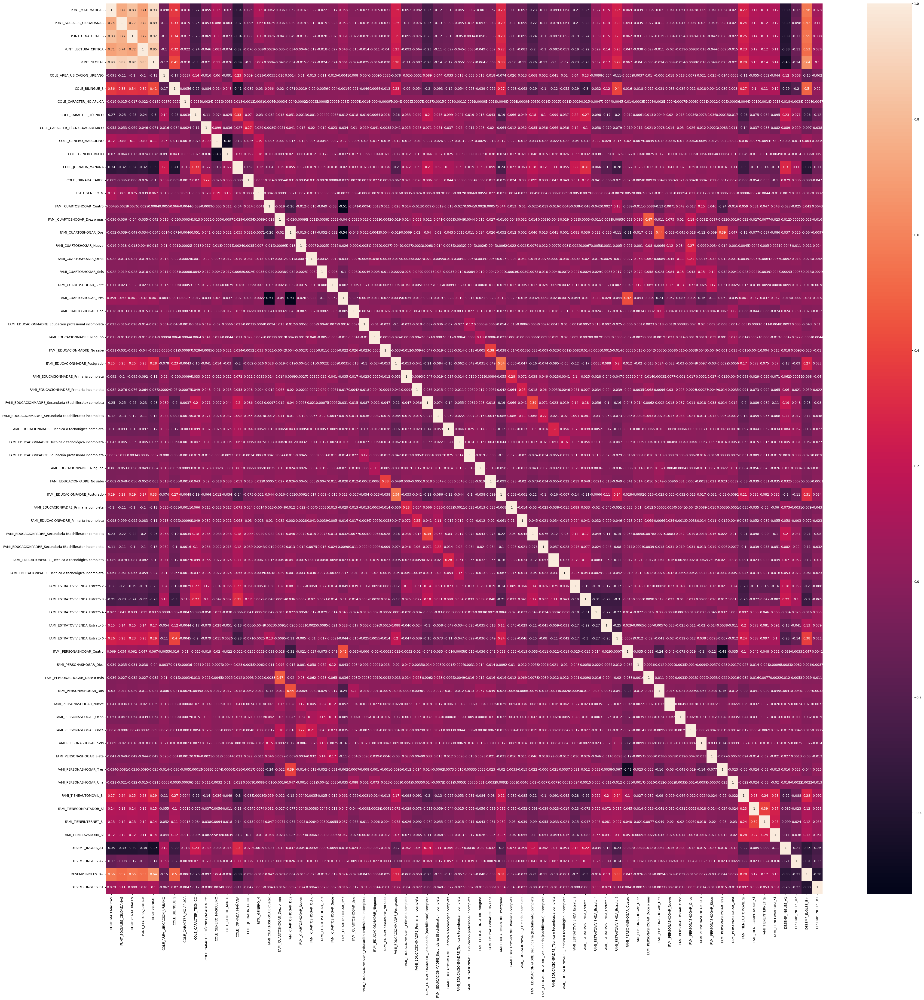

In [143]:
import seaborn as sns
plt.figure(figsize=(50,50))
sns.heatmap(data_num.corr(),annot=True)

In [144]:
profile_data=ProfileReport(data, minimal=False) # minimal=True
profile_data

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 21/21 [00:00<00:00, 100.45it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Redundancias: correlaciones mayores a 0.8 en  la matriz
Irrelevancia: correlaciones muy bajas con la variable objetivo (menor a 0.05)

In [145]:
#Eliminamos correlaciones altas mayores a 0.8 en la matriz

data = data.drop('PUNT_C_NATURALES',axis=1)
data = data.drop('PUNT_LECTURA_CRITICA',axis=1)
data = data.drop('PUNT_MATEMATICAS',axis=1)
data = data.drop('PUNT_SOCIALES_CIUDADANAS',axis=1)

data.head()

,COLE_AREA_UBICACION,COLE_BILINGUE,COLE_CARACTER,COLE_GENERO,COLE_JORNADA,ESTU_GENERO,FAMI_CUARTOSHOGAR,FAMI_EDUCACIONMADRE,FAMI_EDUCACIONPADRE,FAMI_ESTRATOVIVIENDA,FAMI_PERSONASHOGAR,FAMI_TIENEAUTOMOVIL,FAMI_TIENECOMPUTADOR,FAMI_TIENEINTERNET,FAMI_TIENELAVADORA,DESEMP_INGLES,PUNT_GLOBAL
0,URBANO,N,TÉCNICO/ACADÉMICO,MASCULINO,COMPLETA,M,Tres,Postgrado,Educación profesional completa,Estrato 4,Tres,Si,Si,Si,Si,B+,437
1,URBANO,N,TÉCNICO,MIXTO,MAÑANA,M,Dos,Postgrado,Secundaria (Bachillerato) completa,Estrato 3,Tres,Si,Si,Si,Si,A2,355
2,URBANO,S,ACADÉMICO,MIXTO,COMPLETA,M,Cuatro,Educación profesional incompleta,Educación profesional completa,Estrato 6,Cinco,Si,Si,Si,Si,B+,363
3,RURAL,S,ACADÉMICO,MIXTO,MAÑANA,M,Tres,Educación profesional completa,Educación profesional completa,Estrato 6,Tres,Si,Si,Si,Si,B1,350
4,RURAL,S,ACADÉMICO,MIXTO,COMPLETA,M,Dos,Postgrado,Educación profesional completa,Estrato 6,Dos,Si,Si,Si,Si,B+,378


In [146]:
#Eliminamos correlaciones altas mayores a 0.8 en la matriz

data = data.drop('COLE_GENERO',axis=1)
data = data.drop('ESTU_GENERO',axis=1)
data = data.drop('FAMI_CUARTOSHOGAR',axis=1)
data = data.drop('FAMI_PERSONASHOGAR',axis=1)

data.head()

,COLE_AREA_UBICACION,COLE_BILINGUE,COLE_CARACTER,COLE_JORNADA,FAMI_EDUCACIONMADRE,FAMI_EDUCACIONPADRE,FAMI_ESTRATOVIVIENDA,FAMI_TIENEAUTOMOVIL,FAMI_TIENECOMPUTADOR,FAMI_TIENEINTERNET,FAMI_TIENELAVADORA,DESEMP_INGLES,PUNT_GLOBAL
0,URBANO,N,TÉCNICO/ACADÉMICO,COMPLETA,Postgrado,Educación profesional completa,Estrato 4,Si,Si,Si,Si,B+,437
1,URBANO,N,TÉCNICO,MAÑANA,Postgrado,Secundaria (Bachillerato) completa,Estrato 3,Si,Si,Si,Si,A2,355
2,URBANO,S,ACADÉMICO,COMPLETA,Educación profesional incompleta,Educación profesional completa,Estrato 6,Si,Si,Si,Si,B+,363
3,RURAL,S,ACADÉMICO,MAÑANA,Educación profesional completa,Educación profesional completa,Estrato 6,Si,Si,Si,Si,B1,350
4,RURAL,S,ACADÉMICO,COMPLETA,Postgrado,Educación profesional completa,Estrato 6,Si,Si,Si,Si,B+,378


**2. Balanceo de datos (Clasificación)**

In [147]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12940 entries, 0 to 12970
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   COLE_AREA_UBICACION   12940 non-null  category
 1   COLE_BILINGUE         12940 non-null  category
 2   COLE_CARACTER         12940 non-null  category
 3   COLE_JORNADA          12940 non-null  category
 4   FAMI_EDUCACIONMADRE   12940 non-null  category
 5   FAMI_EDUCACIONPADRE   12940 non-null  category
 6   FAMI_ESTRATOVIVIENDA  12940 non-null  category
 7   FAMI_TIENEAUTOMOVIL   12940 non-null  category
 8   FAMI_TIENECOMPUTADOR  12940 non-null  category
 9   FAMI_TIENEINTERNET    12940 non-null  category
 10  FAMI_TIENELAVADORA    12940 non-null  category
 11  DESEMP_INGLES         12940 non-null  category
 12  PUNT_GLOBAL           12940 non-null  int64   
dtypes: category(12), int64(1)
memory usage: 872.1 KB


In [148]:
from imblearn.over_sampling import SMOTE, SMOTENC

data_original = data.copy()

X = data_original.drop('DESEMP_INGLES', axis=1)
Y = data_original['DESEMP_INGLES']

#Codificar X categóricas temporalmente
X_encoded = X.copy()
for col in X_encoded.select_dtypes(include='category').columns:
    X_encoded[col] = X_encoded[col].cat.codes

#Codificar Y temporalmente
Y_encoded = Y.cat.codes
label_mapping = dict(enumerate(Y.cat.categories))

#Índices de columnas categóricas
cat_features = [i for i, col in enumerate(X.columns) if col != 'PUNT_GLOBAL']

#Aplicar SMOTE
sm = SMOTENC(categorical_features=cat_features, random_state=42, k_neighbors=2)
X_bal, Y_bal = sm.fit_resample(X_encoded, Y_encoded)

In [149]:
#Nuevo dataframe con los datos balanceados
X_bal_df = pd.DataFrame(X_bal, columns=X.columns)

#Convertir columnas categóricas a categorías originales
for col in X.select_dtypes(include='category').columns:
    X_bal_df[col] = pd.Categorical.from_codes(X_bal_df[col], categories=X[col].cat.categories)

#Etiquetas originales
Y_bal_labels = pd.Series(Y_bal).map(label_mapping)

data = X_bal_df.copy()
data['DESEMP_INGLES'] = Y_bal_labels

<Axes: xlabel='DESEMP_INGLES'>

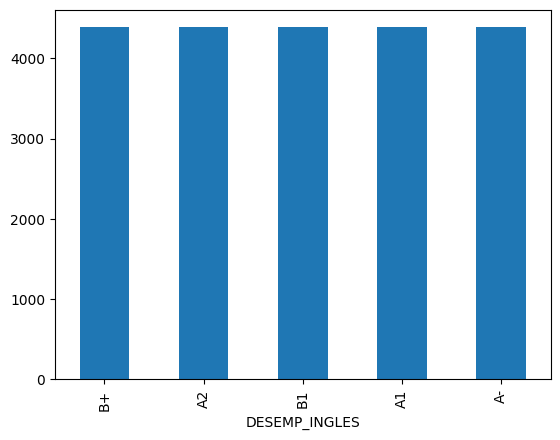

In [150]:
data['DESEMP_INGLES'].value_counts().plot(kind='bar')

In [151]:
profile_data=ProfileReport(data, minimal=False) # minimal=True
profile_data

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 13/13 [00:00<00:00, 76.74it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [152]:
#Guardamos en html el perfilado de datos
profile_data.to_file(output_file="PerfiladoDatosFinal.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [153]:
#Guardamos los datos preparados
data.to_excel('./ResultadosSaberLimpios.xlsx')